# DEEP LEARNING MID EXAM No 2

### DATASET 2B

[LO 1, LO 2, LO 3 & LO 4, 60%] Chaplin sedang mempelajari Buah-buahan. Dia ingin membuat sebuah
aplikasi sederhana untuk mengklasifikasikan jenis-jenis buah ini. Kemudian dia mengumpulkan data
buah tersebut sebagai berikut:


Dataset buah dapat diunduh di: https://tinyurl.com/UTSDeepLearning2024No2
Anda diminta untuk membantu Chaplin dalam melakukan klasifikasi ini.

Setiap mahasiswa
mendapatkan dataset yang terdiri dari 4 kelas buah. Setelah mengunduh dataset yang sesuai untuk anda, kemudian buatlah arsitektur Convolutional
Neural Network untuk permasalahan Image multiclass classification.

In [1]:
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
import os
import shutil
import pandas as pd
import numpy as np
from datetime import datetime
import tensorflow as tf
import random

SEED = 42
random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Check GPU

In [ ]:
gpu = tf.config.list_physical_devices('GPU')

if gpu:
    for i in gpu:
        print(i)
else:
    print("NO GPU DETECTED.")

PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')


# a) Create Color Hist

[LO 3, 5 poin] Lakukan eksplorasi terhadap data tersebut dengan melihat histogram warnanya
dan lakukan proses augmentasi data jika diperlukan. Dan kemudian lakukan resize resolusi
gambar menjadi 224 x 224. Pisahkan dataset menjadi 80% training set, 10% validation set dan
10% test set.

In [ ]:
# DatasetPath = "/content/drive/My Drive/Colab Notebooks/Deep Learning UTS/No2/Dataset2B"
DatasetPath = "/content/drive/My Drive/Deep Learning UTS/No2/Dataset2B"

In [ ]:
image_paths = []
labels = []

for class_dir in os.listdir(DatasetPath):
    class_path = os.path.join(DatasetPath, class_dir)
    if os.path.isdir(class_path):
        for filename in os.listdir(class_path):
            image_path = os.path.join(class_path, filename)
            labels.append(class_dir)
            image_paths.append(image_path)

print(f"Found {len(image_paths)} images in {len(set(labels))} classes.")


Found 1600 images in 4 classes.


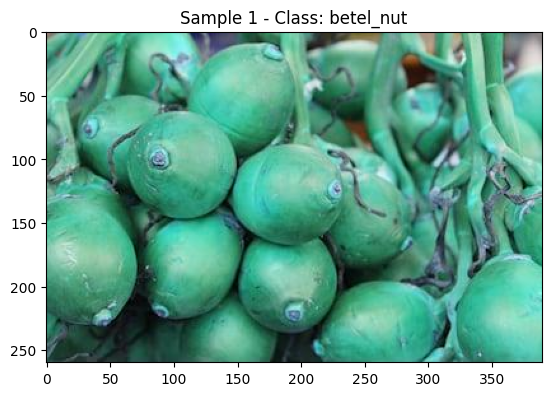

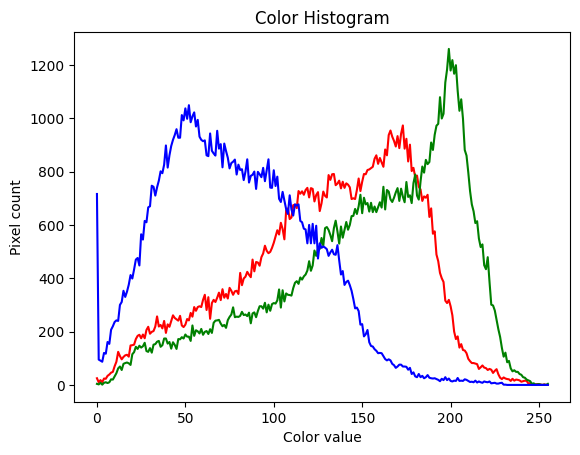

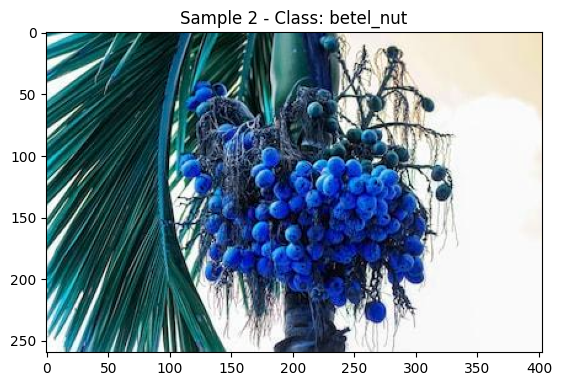

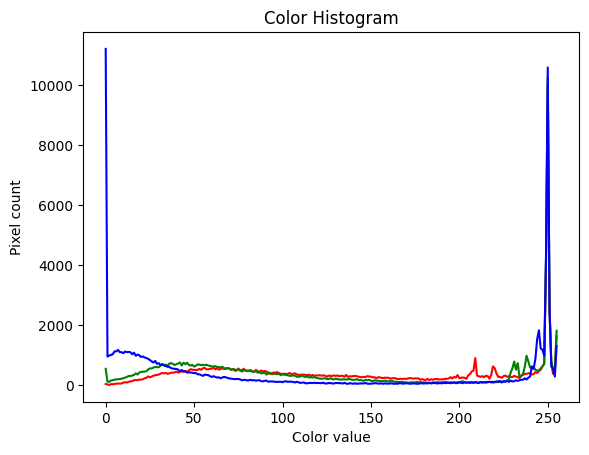

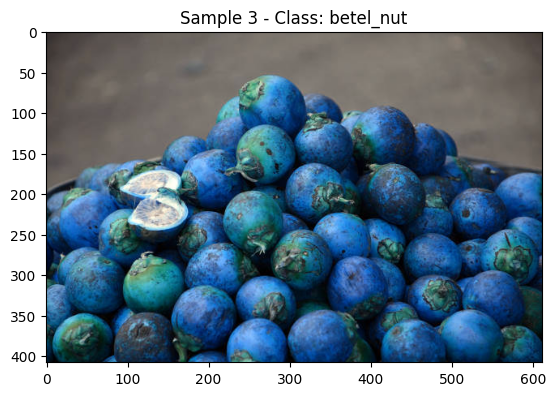

...

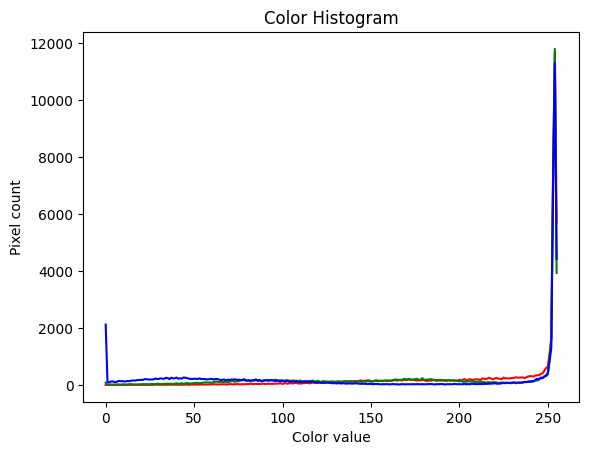

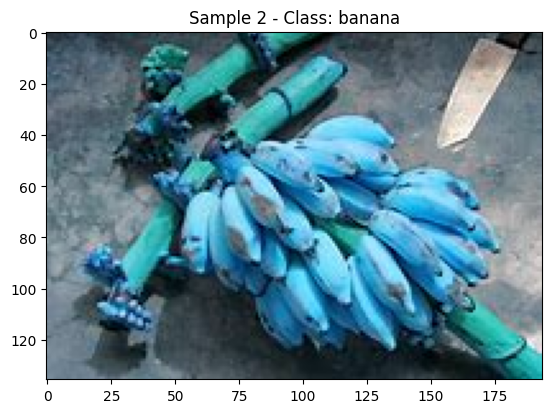

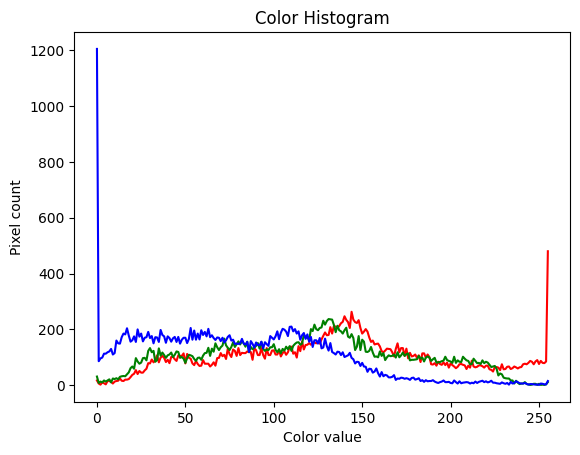

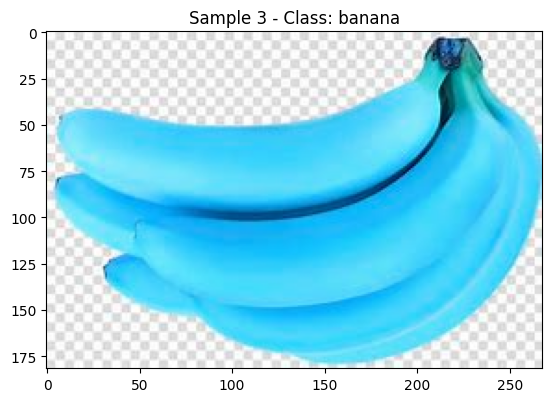

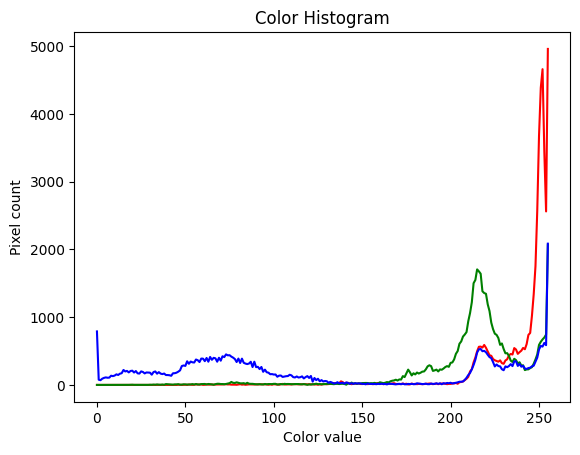

In [ ]:
import cv2

class_counts = {}
for label in labels:
    class_counts[label] = 0

for i, (image_path, label) in enumerate(zip(image_paths, labels)):
    if class_counts[label] < 3:
        image = cv2.imread(image_path)
        plt.imshow(image)
        plt.title(f"Sample {class_counts[label]+1} - Class: {label}")
        plt.show()
        class_counts[label] += 1

        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        colors = ("red", "green", "blue")

        for channel_id, color in enumerate(colors):
            histogram, bin_edges = np.histogram(
                image_rgb[:, :, channel_id], bins=256, range=(0, 256)
            )
            plt.plot(bin_edges[0:-1], histogram, color=color)

        plt.title("Color Histogram")
        plt.xlabel("Color value")
        plt.ylabel("Pixel count")
        plt.show()

In [ ]:
dimensions = []

for image_path in image_paths:
    image = cv2.imread(image_path)
    height, width, channels = image.shape
    dimensions.append([height, width, channels])

df_dimensions = pd.DataFrame(dimensions, columns=["Height", "Width", "Channels"])
print(df_dimensions.describe()) 

            Height        Width  Channels
count  1600.000000  1600.000000    1600.0
mean    231.203125   281.304375       3.0
std      90.885357   116.138314       0.0
min     100.000000   100.000000       3.0
25%     180.000000   201.750000       3.0
50%     210.000000   259.000000       3.0
75%     260.000000   347.000000       3.0
max    1398.000000  1000.000000       3.0


Dari code diatas, saya mengambil 3 sample dari setiap class dan mencoba melihat color hist yang ada pada masing-masing sample. Memang sample yang diambil tidak bisa dibilang merepresentasikan seluruh dataset, namun kita dapat mengetahui bahwa dataset ini memiliki variasi yang luas untuk warna-warna pada imagenya. Beberapa gambar memiliki peak dari color value yang berbeda-beda, ada intensitas colornya memuncak pada daerah yang berbeda, ada pula yang hanya dominan terhadap 1 warna, dll. Bila kita lihat sample yg diambil, cukup banyak dari mereka yang memiliki peak di warna biru.

Selain itu, untuk dimension dari datanya sendiri bisa kita lihat sangat bervariasi, ada yang sangat besar resolusinya, adapula yang kecil.

# a) Read Image Data

In [3]:
# DatasetPath = "/content/drive/My Drive/Colab Notebooks/Deep Learning UTS/No2/"
DatasetPath = "/content/drive/My Drive/Deep Learning UTS/No2/"

In [ ]:
ds = tf.keras.preprocessing.image_dataset_from_directory(
    os.path.join(DatasetPath,"Dataset2B"),
    label_mode = "categorical",
    seed=SEED,
    image_size=(224,224),
    batch_size=4,
)

Found 1600 files belonging to 4 classes.


In [14]:
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
    os.path.join(DatasetPath,"Dataset2B"),
    validation_split=0.2,
    label_mode = "categorical",
    subset="training",
    seed=SEED,
    image_size=(224,224),
    batch_size=4,
)

val_test = tf.keras.preprocessing.image_dataset_from_directory(
    os.path.join(DatasetPath,"Dataset2B"),
    validation_split=0.2,
    label_mode = "categorical",
    subset="validation",
    seed=SEED,
    image_size=(224,224),
    batch_size=4,
)

# Split val_test_ds into validation and test sets
val_size = int(0.5 * len(val_test))
test_size = int(0.5 * len(val_test))
val_ds = val_test.take(val_size)
test_ds = val_test.skip(val_size)


Found 1500 files belonging to 4 classes.
Using 1200 files for training.
Found 1500 files belonging to 4 classes.
Using 300 files for validation.


In [ ]:
train_ds.class_names

['banana', 'betel_nut', 'bitter_gourd', 'black_berry']

# b) Challenges in dataset

[LO 3, 10 poin] Identifikasikan tantangan dan kesulitan dari data image yang diberikan. Hal ini
terkait dengan Image Quality (Resolution, Noise) dan Image Variability (Lighting Conditions,
Perspective and Angle, Occlusions, Background Variability, Scale Variations). Berikan contohnya.

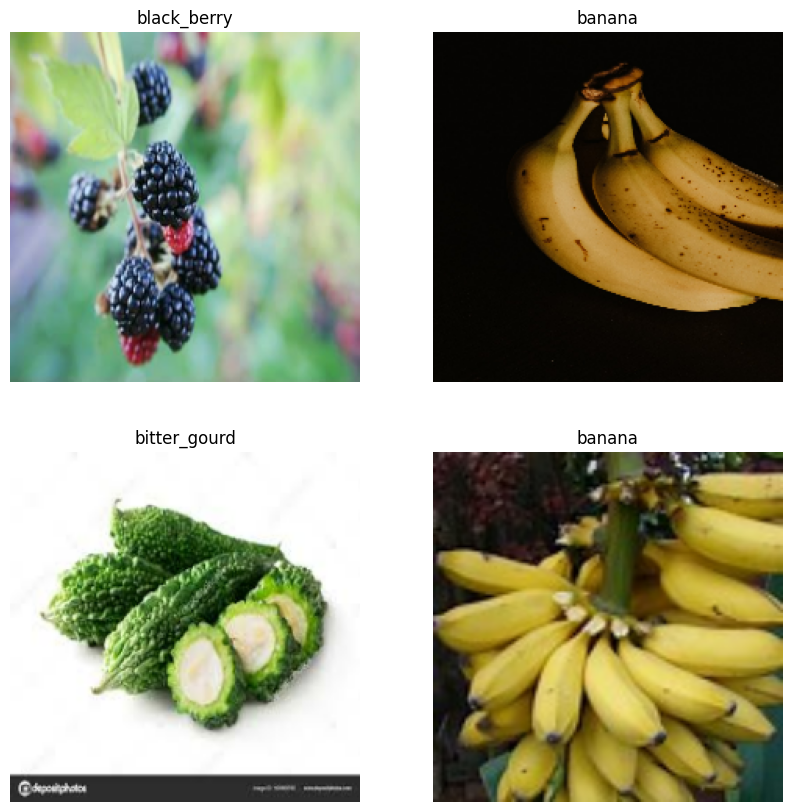

In [ ]:
plt.figure(figsize=(10, 10))
for images, labels in ds.take(1):
    for i in range(len(images)):
        ax = plt.subplot(2, 2, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        # print(int(np.argmax(labels[i])))
        plt.title(ds.class_names[int(np.argmax(labels[i].numpy()).astype("uint8"))])
        plt.axis("off")



Dataset yang diberikan tidak begitu besar, sehingga kita dapat melihat secara sekilas, satu per satu untuk membahas tantangan dan kesulitan pada dataset tersebut. Contohnya mulai dari image resolution, dalam dataset yang diberikan, file-file imagenya sangat bervariasi resolusinya. Sehingga, ketika kita melakukan proses resizing, maka gambar yang diberikan dapat berubah valuenya karena salah satunya ter-stretch. Selain itu, orientation dari image-imagenya sendiri sangat bervariasi, ada yang portrait, ada pula yang landscape. Noise sendiri merujuk pada variasi brightness atau warna yang random pada suatu image. Jika melihat sekilas semua data gambar, tidak terlihat adanya noise, setidaknya tidak ada yang cukup signifikan untuk dipermasalahkan.

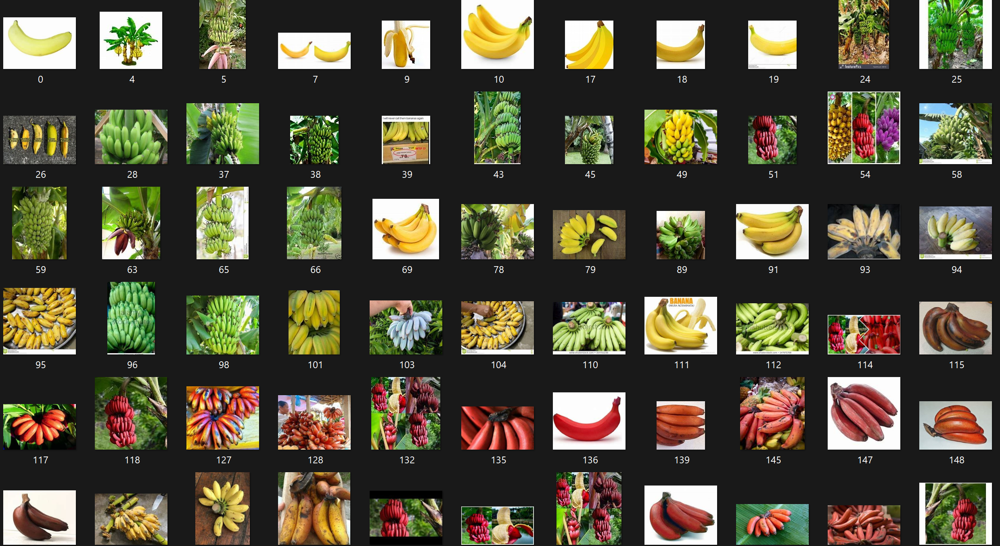

Selanjutnya, perbedaan lighting pada gambar dapat menghasilkan kontras yang berbeda, sehingga mempersulit model untuk mempelajari objek secara keseluruhan. Dalam dataset yang diberikan, beberapa image yang memiliki lightning yang cukup berbeda, seperti image pada kondisi sedang terpapar matahari/terkena flash kamera (terlihat cukup terang) dan image dengan keadaan tertutup bayangan. 

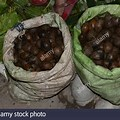 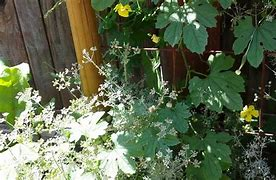 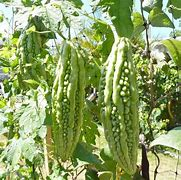

Dalam konteks angle dan perspective, objek dalam gambar mungkin difoto dari berbagai sudut dan perspektif. Hal ini dapat menyebabkan variasi dalam representasi objek dan konteksnya. Pada dataset, ada objek yang difoto dari depan, dari samping, terbalik, miring, dst.

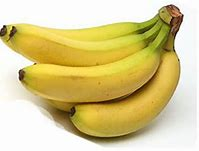 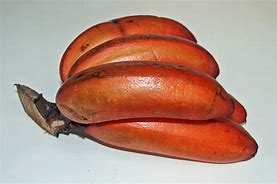 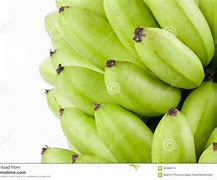

Pada beberapa image juga terdapat occlusions/penghalang objek. Apabila image memiliki objek yang menutupi objek utama, objek utama menjadi sulit dikenali.

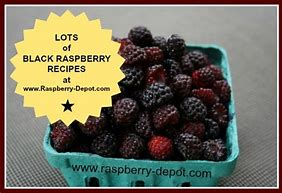 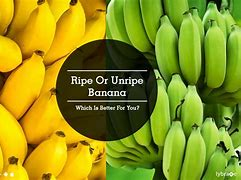

Dalam hal background variability, hal yang bisa saya dapat dari melihat gambar-gambar yang ada pada dataset adalah, apabila warna benda-benda disekitar mirip dengan buah yang ingin kita klasifikasi, hal tersebut dapat menyulitkan model dalam membedakan buah-buah tersebut. Background yang biasa saja juga dapat mengganggu apabila objek utamanya sangat kecil sehingga image harus difokuskan pada benda utama (baiknya dicrop). 

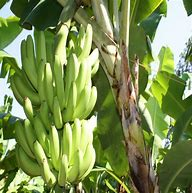 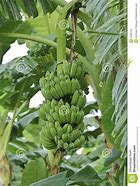 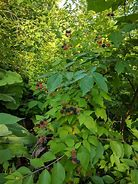

Untuk scale variations sendiri dapat berhubungan dengan orientasi dari gambar seperti yang sudah dibahas diatas tadi. Ada gambar yang berukuran 390 x 260, ada yang 173 x 260. Ada yang bentuk horizontal maupun vertikal.

Selain hal-hal yang disebutkan diatas, terdapat pula image yang bukan memfokuskan pada buah yang ingin diklasifikasi, melainkan pada objek di sekitarnya. Seperti pada gambar banana split dan monyet yang memegang pisang ini. (Seharusnya bisa masuk background variability)

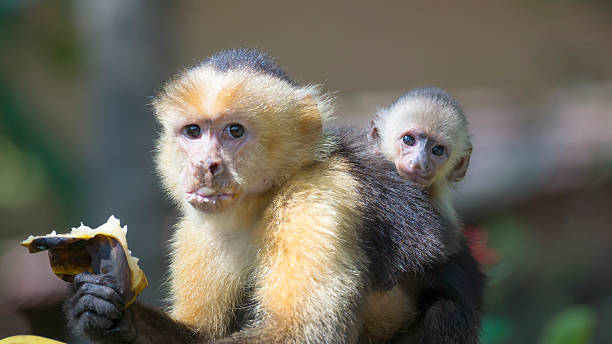 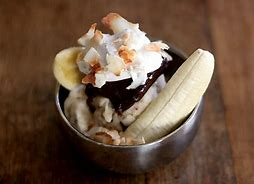

Berdasarkan analisa diatas, kita dapat menyimpulkan bahwa dataset yang diberikan memang memiliki variasi yang cukup besar antar gambar-gambarnya. Beberapa variasi ini apabila tidak dipreprocess atau di filter terlebih dahulu, dapat bersifat seperti outlier pada data yang mana, jika banyak jumlahnya dapat membingungkan model. Namun, variasi-variasi ini juga penting dalam memastikan bahwa model bisa memprediksi berbagai jenis gambar yang diberikan/tidak sensitif terhadap outlier. Oleh karena itu, untuk sekarang saya memutuskan untuk tidak melakukan augmentation terlebih dahulu dan melihat performa model nantinya.

# c) Base Model

[LO 3, 15 poin] Buatlah arsitektur baseline sesuai dengan gambar arsitektur VGG-16 berikut ini:
(Catatan: Activation function tiap hidden layer menggunakan ReLU). Jelaskan mengenai model
pretained dari VGG-16 yang digunakan dan metode fine-tuning yang dilakukan.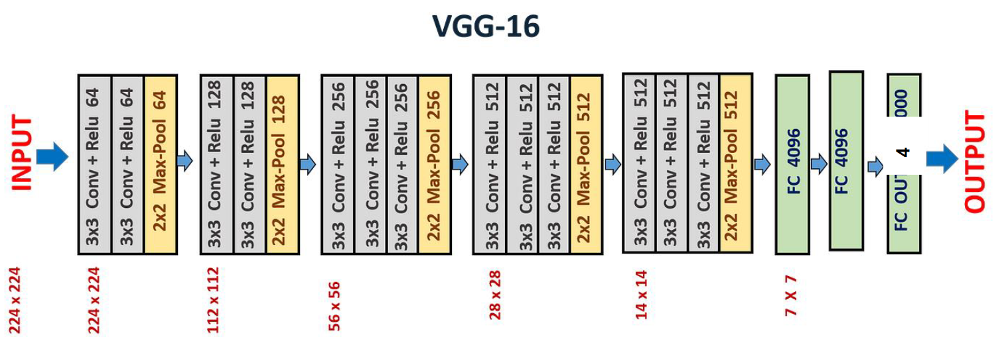

In [15]:
import tensorflow
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Sequential
from tensorflow.keras.callbacks import EarlyStopping
from keras.metrics import AUC

## Recreated Architecture (Baseline Model)

Berikut ini adalah baseline architechture yang dibuat mirip dengan pre-trained model VGG-16

In [ ]:
input_shape = (224, 224, 3)

base = Sequential([
  Conv2D(64, kernel_size=(3, 3), activation='relu', input_shape=input_shape),
  Conv2D(64, kernel_size=(3, 3), activation='relu'),
  MaxPooling2D(pool_size=(2, 2)),

  Conv2D(128, kernel_size=(3, 3), activation='relu'),
  Conv2D(128, kernel_size=(3, 3), activation='relu'),
  MaxPooling2D(pool_size=(2, 2)),

  Conv2D(256, kernel_size=(3, 3), activation='relu'),
  Conv2D(256, kernel_size=(3, 3), activation='relu'),
  MaxPooling2D(pool_size=(2, 2)),

  Conv2D(512, kernel_size=(3, 3), activation='relu'),
  Conv2D(512, kernel_size=(3, 3), activation='relu'),
  MaxPooling2D(pool_size=(2, 2)),

  Conv2D(512, kernel_size=(3, 3), activation='relu'),
  Conv2D(512, kernel_size=(3, 3), activation='relu'),
  MaxPooling2D(pool_size=(2, 2)),

  Flatten(),
  Dense(4096, activation='relu'),
  Dense(4096, activation='relu'),
  Dense(4, activation='softmax')
])


In [ ]:
# Compile the model
base.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['categorical_accuracy', AUC()])
base.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 64)      1792      
                                                                 
 conv2d_1 (Conv2D)           (None, 220, 220, 64)      36928     
                                                                 
 max_pooling2d (MaxPooling2  (None, 110, 110, 64)      0         
 D)                                                              
                                                                 
 conv2d_2 (Conv2D)           (None, 108, 108, 128)     73856     
                                                                 
 conv2d_3 (Conv2D)           (None, 106, 106, 128)     147584    
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 53, 53, 128)       0         
 g2D)                                                   

In [16]:
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

In [ ]:
history1 = base.fit(train_ds, epochs=50, validation_data=val_ds, callbacks=[early_stopping])

Epoch 1/50
320/320 [==============================] - 212s 604ms/step - loss: 7.9909 - categorical_accuracy: 0.2773 - auc: 0.5287 - val_loss: 1.3935 - val_categorical_accuracy: 0.2313 - val_auc: 0.4409
Epoch 2/50
320/320 [==============================] - 22s 69ms/step - loss: 1.4074 - categorical_accuracy: 0.2773 - auc: 0.5487 - val_loss: 1.4004 - val_categorical_accuracy: 0.2500 - val_auc: 0.4437
Epoch 3/50
320/320 [==============================] - 23s 70ms/step - loss: 1.3875 - categorical_accuracy: 0.2617 - auc: 0.5105 - val_loss: 1.3908 - val_categorical_accuracy: 0.2250 - val_auc: 0.4744
Epoch 4/50
320/320 [==============================] - 22s 69ms/step - loss: 1.3789 - categorical_accuracy: 0.2477 - auc: 0.5249 - val_loss: 1.3943 - val_categorical_accuracy: 0.2188 - val_auc: 0.4333
Epoch 5/50
320/320 [==============================] - 22s 68ms/step - loss: 1.5436 - categorical_accuracy: 0.2797 - auc: 0.5419 - val_loss: 1.3904 - val_categorical_accuracy: 0.2062 - val_auc: 0.457

In [ ]:
loss, accuracy, auc = base.evaluate(test_ds)
print("Test Loss:", loss, "Test Accuracy:", accuracy, "Test AUC:", auc)

40/40 [==============================] - 10s 249ms/step - loss: 1.3855 - categorical_accuracy: 0.2625 - auc: 0.5115
Test Loss: 1.3855202198028564 Test Accuracy: 0.26249998807907104 Test AUC: 0.5114973783493042


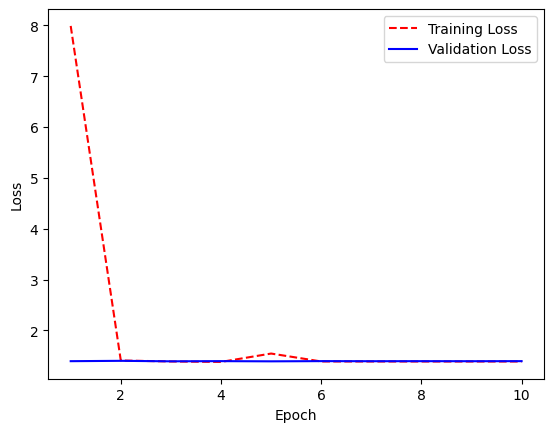

In [ ]:
training_loss = history1.history['loss']
val_loss = history1.history['val_loss']

epoch_count = range(1, len(training_loss) + 1)

# Visualize loss history
plt.plot(epoch_count, training_loss, 'r--')
plt.plot(epoch_count, val_loss, 'b-')
plt.legend(['Training Loss', 'Validation Loss'])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.show()

Dapat dilihat pada pembuatan arsitektur manual di atas, model yang dihasilkan sangat jelek dan tidak cocok pada datanya dengan akurasi hanya 0.2933333218097687

## VGG-16 Pretrained Model

In [ ]:
from tensorflow.keras.applications import VGG16

base_model = VGG16(
    weights='imagenet',
    input_shape=(224, 224, 3),
    include_top=False
)

base_model.trainable = False

In [ ]:
from tensorflow.keras.layers import Input
from tensorflow.keras.models import Model

input_layer = Input(shape=input_shape)

x = base_model(input_layer, training=False)

# Add pooling layer or flatten layer
x = Flatten()(x)
x = Dense(4096, activation='relu')(x)
x = Dense(4096, activation='relu')(x)
# Add final dense layer
output_layer = Dense(4, activation = 'softmax')(x)

# Combine inputs and outputs to create model
model = Model(input_layer, output_layer)

In [ ]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 flatten_1 (Flatten)         (None, 25088)             0         
                                                                 
 dense_3 (Dense)             (None, 4096)              102764544 
                                                                 
 dense_4 (Dense)             (None, 4096)              16781312  
                                                                 
 dense_5 (Dense)             (None, 4)                 16388     
                                                                 
Total params: 134276932 (512.23 MB)
Trainable params: 1195622

In [ ]:
model.get_layer('vgg16').summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [ ]:
model.compile(loss='categorical_crossentropy', metrics = ['categorical_accuracy', AUC()])

#### Fit with model trainable = false

In [ ]:
history = model.fit(train_ds, validation_data=val_ds, epochs=20)

Epoch 1/20
320/320 [==============================] - 20s 52ms/step - loss: 27.8692 - categorical_accuracy: 0.7750 - auc_1: 0.8699 - val_loss: 0.5543 - val_categorical_accuracy: 0.9125 - val_auc_1: 0.9636
Epoch 2/20
320/320 [==============================] - 16s 51ms/step - loss: 0.9682 - categorical_accuracy: 0.9414 - auc_1: 0.9708 - val_loss: 1.5015 - val_categorical_accuracy: 0.9500 - val_auc_1: 0.9662
Epoch 3/20
320/320 [==============================] - 18s 54ms/step - loss: 0.5250 - categorical_accuracy: 0.9758 - auc_1: 0.9861 - val_loss: 3.1916 - val_categorical_accuracy: 0.8687 - val_auc_1: 0.9236
Epoch 4/20
320/320 [==============================] - 16s 50ms/step - loss: 0.7927 - categorical_accuracy: 0.9789 - auc_1: 0.9882 - val_loss: 5.4423 - val_categorical_accuracy: 0.8750 - val_auc_1: 0.9394
Epoch 5/20
320/320 [==============================] - 16s 50ms/step - loss: 0.3199 - categorical_accuracy: 0.9875 - auc_1: 0.9933 - val_loss: 1.9740 - val_categorical_accuracy: 0.9563

In [ ]:
loss, accuracy, auc = model.evaluate(test_ds)
print("Test Loss:", loss, "Test Accuracy:", accuracy, "Test AUC:", auc)

40/40 [==============================] - 2s 30ms/step - loss: 2.5097 - categorical_accuracy: 0.9375 - auc_1: 0.9583
Test Loss: 2.509735584259033 Test Accuracy: 0.9375 Test AUC: 0.9583333730697632


In [ ]:
VGG16_predictions = model.predict(test_ds)
VGG16_predictions

40/40 [==============================] - 2s 28ms/step


array([[0.00000000e+00, 1.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 1.99086073e-32, 1.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 1.00000000e+00, 0.00000000e+00],
       [1.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 1.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 1.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 1.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 1.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 1.00000000e+00],
       [0.00000000e+00, 1.00000000e+00, 0.00000000e+00, 1.22188622e-26],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 1.00000000e+00],
       [0.00000000e+00, 1.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [1.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e

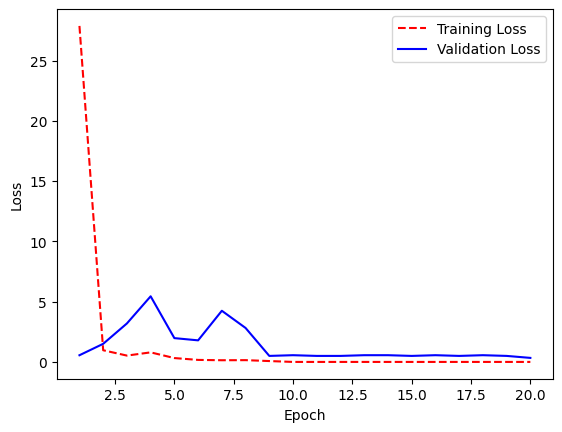

In [ ]:
training_loss = history.history['loss']
val_loss = history.history['val_loss']

epoch_count = range(1, len(training_loss) + 1)

# Visualize loss history
plt.plot(epoch_count, training_loss, 'r--')
plt.plot(epoch_count, val_loss, 'b-')
plt.legend(['Training Loss', 'Validation Loss'])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.show()

#### Update model Trainable

In [ ]:
model.trainable=True
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 flatten_1 (Flatten)         (None, 25088)             0         
                                                                 
 dense_3 (Dense)             (None, 4096)              102764544 
                                                                 
 dense_4 (Dense)             (None, 4096)              16781312  
                                                                 
 dense_5 (Dense)             (None, 4)                 16388     
                                                                 
Total params: 134276932 (512.23 MB)
Trainable params: 1342769

In [ ]:
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate = .00001), loss = 'categorical_crossentropy' , metrics = ['categorical_accuracy', AUC()])

In [ ]:
history = model.fit(train_ds, validation_data=val_ds, epochs=20)

Epoch 1/20
320/320 [==============================] - 45s 113ms/step - loss: 0.0000e+00 - categorical_accuracy: 1.0000 - auc_2: 1.0000 - val_loss: 0.4988 - val_categorical_accuracy: 0.9812 - val_auc_2: 0.9875
Epoch 2/20
320/320 [==============================] - 36s 112ms/step - loss: 0.0000e+00 - categorical_accuracy: 1.0000 - auc_2: 1.0000 - val_loss: 0.4582 - val_categorical_accuracy: 0.9875 - val_auc_2: 0.9917
Epoch 3/20
320/320 [==============================] - 37s 116ms/step - loss: 0.0000e+00 - categorical_accuracy: 1.0000 - auc_2: 1.0000 - val_loss: 0.4988 - val_categorical_accuracy: 0.9812 - val_auc_2: 0.9875
Epoch 4/20
320/320 [==============================] - 36s 111ms/step - loss: 0.0000e+00 - categorical_accuracy: 1.0000 - auc_2: 1.0000 - val_loss: 0.4988 - val_categorical_accuracy: 0.9812 - val_auc_2: 0.9875
Epoch 5/20
320/320 [==============================] - 36s 112ms/step - loss: 0.0000e+00 - categorical_accuracy: 1.0000 - auc_2: 1.0000 - val_loss: 0.4988 - val_cate

In [ ]:
loss, accuracy, auc = model.evaluate(test_ds)
print("Test Loss:", loss, "Test Accuracy:", accuracy, "Test AUC:", auc)

40/40 [==============================] - 2s 30ms/step - loss: 2.5097 - categorical_accuracy: 0.9375 - auc_2: 0.9583
Test Loss: 2.5097358226776123 Test Accuracy: 0.9375 Test AUC: 0.9583333730697632


In [ ]:
VGG16_predictions = model.predict(test_ds)
VGG16_predictions

40/40 [==============================] - 2s 28ms/step


array([[0.00000000e+00, 0.00000000e+00, 1.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 1.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 1.00000000e+00, 0.00000000e+00],
       [6.23776772e-25, 2.52292041e-11, 2.20956646e-24, 1.00000000e+00],
       [0.00000000e+00, 1.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 1.00000000e+00, 0.00000000e+00, 1.22188622e-26],
       [1.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 1.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 1.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 1.00000000e+00],
       [1.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 1.00000000e+00],
       [0.00000000e+00, 1.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 1.00000000e

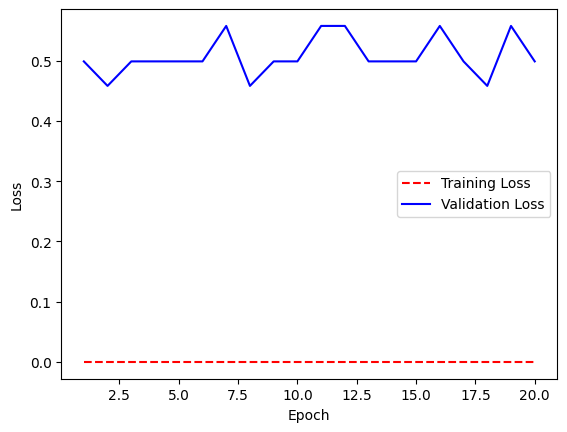

In [ ]:
training_loss = history.history['loss']
val_loss = history.history['val_loss']

epoch_count = range(1, len(training_loss) + 1)

# Visualize loss history
plt.plot(epoch_count, training_loss, 'r--')
plt.plot(epoch_count, val_loss, 'b-')
plt.legend(['Training Loss', 'Validation Loss'])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.show()

Model VGG-16 yang digunakan diatas adalah model yang telah dilatih sebelumnya pada dataset ImageNet. Model ini telah dipelajari untuk mengenali berbagai macam objek dalam gambar, dan telah mengembangkan representasi-fitur yang umum dan bermanfaat dalam proses pengenalan gambar. Jika dilihat dari train val loss chart untuk model yang trainablenya true, kita sapat menyimpulkan akan adanya potensi overfit bagi model-model yang dilatih dengan dataset ini.

# d) Modified Model


[LO 3, 20 poin] Modifikasi arsitektur VGG-16 di atas agar mendapatkan hasil klasifikasi yang
optimal. Kalian dapat menambahkan atau mengurangi arsitektur tersebutdan melakukan
mengubah arsitektur pada nomor 2c dengan menggunakan dropout, batch normalization dan
lain-lainnya. Dan selanjutnya lakukan proses tuning hyperparameter agar akurasi klasifikasinya
meningkat. Berikan alasan mengapa modifikasi arsitektur dan metode tuning hyperparameter
kalian lebih baik terkait dengan tantangan dan dan kesulitan yang dihadapi dalam data image
tersebut (1b).

## Ver 1

In [17]:
from tensorflow.keras.layers import Dropout, BatchNormalization

In [ ]:
input_shape = (224, 224, 3)

modified = Sequential([
    Conv2D(64, kernel_size=(3, 3), activation='relu', input_shape=input_shape),
    Conv2D(64, kernel_size=(3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    BatchNormalization(),

    Conv2D(128, kernel_size=(3, 3), activation='relu'),
    Conv2D(128, kernel_size=(3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    BatchNormalization(),

    Conv2D(256, kernel_size=(3, 3), activation='relu'),
    Conv2D(256, kernel_size=(3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    BatchNormalization(),

    Conv2D(512, kernel_size=(3, 3), activation='relu'),
    Conv2D(512, kernel_size=(3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    BatchNormalization(),

    Conv2D(512, kernel_size=(3, 3), activation='relu'),
    Conv2D(512, kernel_size=(3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    BatchNormalization(),

    GlobalAveragePooling2D(),
    Flatten(),
    Dense(4096, activation='relu'),
    Dropout(0.5),
    Dense(4096, activation='relu'),
    Dropout(0.5),
    Dense(4, activation='softmax')
])

In [ ]:
# Compile the model
modified.compile(loss='categorical_crossentropy', optimizer=tf.keras.optimizers.Adam(learning_rate = .001), metrics=['categorical_accuracy', AUC()])
modified.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 64)      1792      
                                                                 
 conv2d_1 (Conv2D)           (None, 220, 220, 64)      36928     
                                                                 
 max_pooling2d (MaxPooling2  (None, 110, 110, 64)      0         
 D)                                                              
                                                                 
 batch_normalization (Batch  (None, 110, 110, 64)      256       
 Normalization)                                                  
                                                                 
 conv2d_2 (Conv2D)           (None, 108, 108, 128)     73856     
                                                                 
 conv2d_3 (Conv2D)           (None, 106, 106, 128)     1

In [ ]:
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
#
history = modified.fit(train_ds, epochs=50, validation_data=val_ds, callbacks=[early_stopping])

Epoch 1/50
298/298 [==============================] - 148s 416ms/step - loss: 2.5464 - categorical_accuracy: 0.4077 - auc: 0.6479 - val_loss: 2.3027 - val_categorical_accuracy: 0.4730 - val_auc: 0.7103
Epoch 2/50
298/298 [==============================] - 20s 68ms/step - loss: 1.3561 - categorical_accuracy: 0.4723 - auc: 0.7156 - val_loss: 1.1589 - val_categorical_accuracy: 0.5405 - val_auc: 0.7819
Epoch 3/50
298/298 [==============================] - 20s 65ms/step - loss: 1.2251 - categorical_accuracy: 0.5042 - auc: 0.7616 - val_loss: 1.7426 - val_categorical_accuracy: 0.3581 - val_auc: 0.6586
Epoch 4/50
298/298 [==============================] - 20s 67ms/step - loss: 1.1472 - categorical_accuracy: 0.5327 - auc: 0.7796 - val_loss: 1.1941 - val_categorical_accuracy: 0.6081 - val_auc: 0.8389
Epoch 5/50
298/298 [==============================] - 20s 67ms/step - loss: 1.1189 - categorical_accuracy: 0.5638 - auc: 0.7903 - val_loss: 0.6795 - val_categorical_accuracy: 0.7432 - val_auc: 0.922

In [ ]:
loss, accuracy, auc = modified.evaluate(test_ds)
print("Test Loss:", loss, "Test Accuracy:", accuracy, "Test AUC:", auc)

38/38 [==============================] - 12s 301ms/step - loss: 0.8635 - categorical_accuracy: 0.6933 - auc: 0.8844
Test Loss: 0.8635213971138 Test Accuracy: 0.6933333277702332 Test AUC: 0.8844000697135925


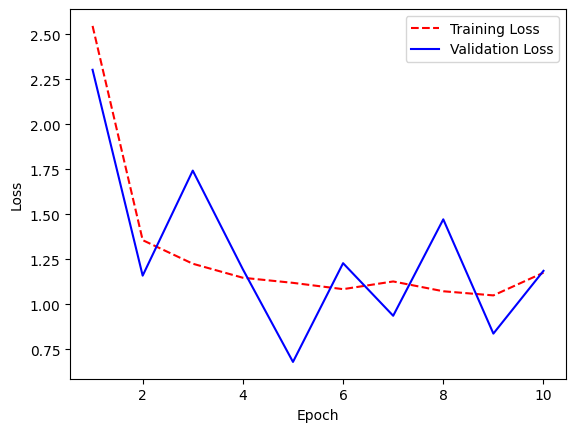

In [ ]:
training_loss = history.history['loss']
val_loss = history.history['val_loss']

epoch_count = range(1, len(training_loss) + 1)

# Visualize loss history
plt.plot(epoch_count, training_loss, 'r--')
plt.plot(epoch_count, val_loss, 'b-')
plt.legend(['Training Loss', 'Validation Loss'])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.show()

## Ver 2

In [ ]:
input_shape = (224, 224, 3)

modified = Sequential([
    Conv2D(64, kernel_size=(3, 3), activation='relu', input_shape=input_shape),
    Conv2D(64, kernel_size=(3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    BatchNormalization(),

    Conv2D(128, kernel_size=(3, 3), activation='relu'),
    Conv2D(128, kernel_size=(3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    BatchNormalization(),

    Conv2D(256, kernel_size=(3, 3), activation='relu'),
    Conv2D(256, kernel_size=(3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    BatchNormalization(),

    Conv2D(512, kernel_size=(3, 3), activation='relu'),
    Conv2D(512, kernel_size=(3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    BatchNormalization(),

    Conv2D(512, kernel_size=(3, 3), activation='relu'),
    Conv2D(512, kernel_size=(3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    BatchNormalization(),

    GlobalAveragePooling2D(),
    Dense(4096, activation='relu'),
    Dropout(0.5),
    Dense(4096, activation='relu'),
    Dropout(0.5),
    Dense(4, activation='softmax')
])


In [ ]:
# Compile the model
modified.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['categorical_accuracy', AUC()])
modified.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_10 (Conv2D)          (None, 222, 222, 64)      1792      
                                                                 
 conv2d_11 (Conv2D)          (None, 220, 220, 64)      36928     
                                                                 
 max_pooling2d_5 (MaxPoolin  (None, 110, 110, 64)      0         
 g2D)                                                            
                                                                 
 batch_normalization_5 (Bat  (None, 110, 110, 64)      256       
 chNormalization)                                                
                                                                 
 conv2d_12 (Conv2D)          (None, 108, 108, 128)     73856     
                                                                 
 conv2d_13 (Conv2D)          (None, 106, 106, 128)    

In [ ]:
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
#
history = modified.fit(train_ds, epochs=50, validation_data=val_ds, callbacks=[early_stopping])

Epoch 1/50
298/298 [==============================] - 26s 72ms/step - loss: 2.5598 - categorical_accuracy: 0.3733 - auc_1: 0.6234 - val_loss: 4.8243 - val_categorical_accuracy: 0.3446 - val_auc_1: 0.5407
Epoch 2/50
298/298 [==============================] - 21s 69ms/step - loss: 1.3244 - categorical_accuracy: 0.4480 - auc_1: 0.7132 - val_loss: 1.4417 - val_categorical_accuracy: 0.4054 - val_auc_1: 0.6495
Epoch 3/50
298/298 [==============================] - 21s 69ms/step - loss: 1.2371 - categorical_accuracy: 0.4715 - auc_1: 0.7436 - val_loss: 0.9549 - val_categorical_accuracy: 0.5946 - val_auc_1: 0.8533
Epoch 4/50
298/298 [==============================] - 20s 67ms/step - loss: 1.1867 - categorical_accuracy: 0.5059 - auc_1: 0.7631 - val_loss: 3.4116 - val_categorical_accuracy: 0.1419 - val_auc_1: 0.4193
Epoch 5/50
298/298 [==============================] - 21s 69ms/step - loss: 1.2191 - categorical_accuracy: 0.4698 - auc_1: 0.7359 - val_loss: 0.7924 - val_categorical_accuracy: 0.6351 

In [ ]:
loss, accuracy, auc = modified.evaluate(test_ds)
print("Test Loss:", loss, "Test Accuracy:", accuracy, "Test AUC:", auc)

38/38 [==============================] - 1s 20ms/step - loss: 1.1258 - categorical_accuracy: 0.5400 - auc_1: 0.7994
Test Loss: 1.1257787942886353 Test Accuracy: 0.5400000214576721 Test AUC: 0.799407422542572


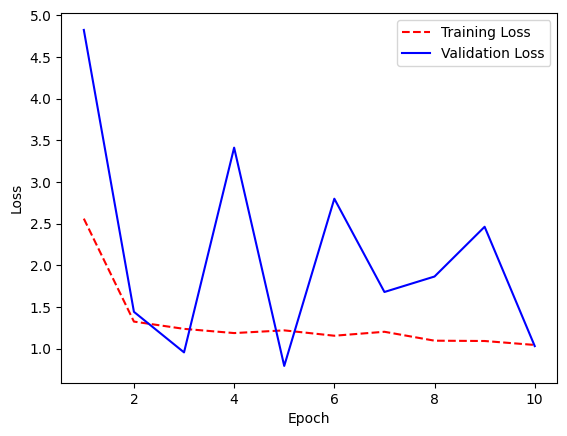

In [ ]:
training_loss = history.history['loss']
val_loss = history.history['val_loss']

epoch_count = range(1, len(training_loss) + 1)

# Visualize loss history
plt.plot(epoch_count, training_loss, 'r--')
plt.plot(epoch_count, val_loss, 'b-')
plt.legend(['Training Loss', 'Validation Loss'])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.show()

## Tuner Ver (best)

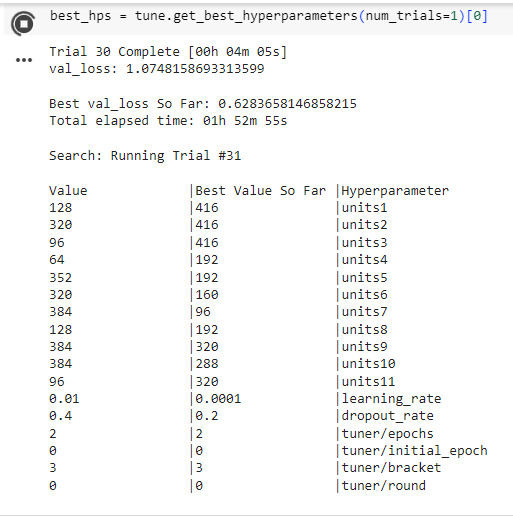

In [18]:
input_shape = (224, 224, 3)

modified_best = Sequential([
    Conv2D(416, kernel_size=(3, 3), activation='relu', input_shape=input_shape),
    Conv2D(416, kernel_size=(3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    BatchNormalization(),
    Dropout(0.2),

    Conv2D(416, kernel_size=(3, 3), activation='relu'),
    Conv2D(192, kernel_size=(3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    BatchNormalization(),
    Dropout(0.2),

    Conv2D(192, kernel_size=(3, 3), activation='relu'),
    Conv2D(160, kernel_size=(3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    BatchNormalization(),
    Dropout(0.2),

    Conv2D(96, kernel_size=(3, 3), activation='relu'),
    Conv2D(192, kernel_size=(3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    BatchNormalization(),
    Dropout(0.2),

    Conv2D(320, kernel_size=(3, 3), activation='relu'),
    Conv2D(288, kernel_size=(3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    BatchNormalization(),
    Dropout(0.2),

    GlobalAveragePooling2D(),
    Dense(320, activation='relu'),
    Dropout(0.2),
    Dense(4, activation='softmax')
])

In [19]:
# Compile the model
modified_best.compile(loss='categorical_crossentropy', optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), metrics=['categorical_accuracy', AUC()])
modified_best.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_10 (Conv2D)          (None, 222, 222, 416)     11648     
                                                                 
 conv2d_11 (Conv2D)          (None, 220, 220, 416)     1557920   
                                                                 
 max_pooling2d_5 (MaxPoolin  (None, 110, 110, 416)     0         
 g2D)                                                            
                                                                 
 batch_normalization_5 (Bat  (None, 110, 110, 416)     1664      
 chNormalization)                                                
                                                                 
 dropout_6 (Dropout)         (None, 110, 110, 416)     0         
                                                                 
 conv2d_12 (Conv2D)          (None, 108, 108, 416)    

In [20]:
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

history_best = modified_best.fit(train_ds, epochs=50, validation_data=val_ds, callbacks=[early_stopping])

Epoch 1/50
300/300 [==============================] - 208s 554ms/step - loss: 1.0606 - categorical_accuracy: 0.5700 - auc_1: 0.8121 - val_loss: 1.0315 - val_categorical_accuracy: 0.5743 - val_auc_1: 0.8188
Epoch 2/50
300/300 [==============================] - 154s 512ms/step - loss: 1.0019 - categorical_accuracy: 0.5908 - auc_1: 0.8323 - val_loss: 1.2649 - val_categorical_accuracy: 0.5270 - val_auc_1: 0.7785
Epoch 3/50
300/300 [==============================] - 157s 523ms/step - loss: 0.9397 - categorical_accuracy: 0.6208 - auc_1: 0.8502 - val_loss: 0.7562 - val_categorical_accuracy: 0.7230 - val_auc_1: 0.9047
Epoch 4/50
300/300 [==============================] - 152s 505ms/step - loss: 0.8715 - categorical_accuracy: 0.6508 - auc_1: 0.8711 - val_loss: 1.0031 - val_categorical_accuracy: 0.6081 - val_auc_1: 0.8505
Epoch 5/50
300/300 [==============================] - 151s 503ms/step - loss: 0.8473 - categorical_accuracy: 0.6633 - auc_1: 0.8773 - val_loss: 0.8982 - val_categorical_accurac

In [24]:
loss, accuracy, auc = modified_best.evaluate(test_ds)
print("Test Loss:", loss, "Test Accuracy:", accuracy, "Test AUC:", auc)

38/38 [==============================] - 6s 142ms/step - loss: 0.4663 - categorical_accuracy: 0.8092 - auc_1: 0.9630
Test Loss: 0.466280996799469 Test Accuracy: 0.8092105388641357 Test AUC: 0.9630149602890015


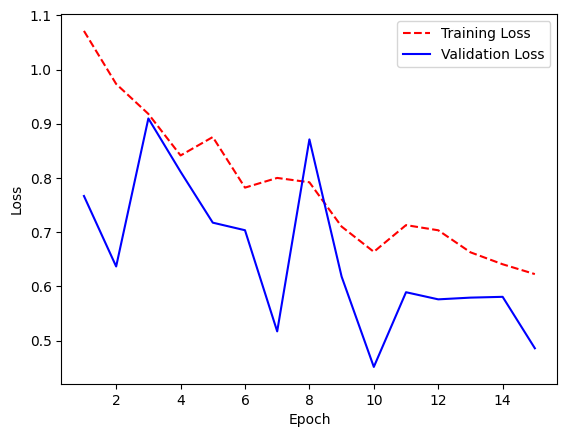

In [ ]:
training_loss = history_best.history['loss']
val_loss = history_best.history['val_loss']

epoch_count = range(1, len(training_loss) + 1)

# Visualize loss history
plt.plot(epoch_count, training_loss, 'r--')
plt.plot(epoch_count, val_loss, 'b-')
plt.legend(['Training Loss', 'Validation Loss'])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.show()

## Hyperparameter tuning

In [ ]:
%pip install keras_tuner

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.1/129.1 kB 1.7 MB/s eta 0:00:00


In [ ]:
import keras_tuner as kt

In [ ]:
def model_builder(hp):
    # Define the hyperparameters to tune
    hp_units1 = hp.Choice('units', values=[32,64,128,256,512,1024,2048,4096])
    hp_learning_rate = hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4])
    hp_dropout_rate = hp.Float('dropout_rate', min_value=0.0, max_value=0.5, step=0.1)

    # Define the input shape
    input_shape = (224, 224, 3)  # Assuming images are 224x224 RGB images

    # Define the model architecture
    model = Sequential([
        Conv2D(64, kernel_size=(3, 3), activation='relu', input_shape=input_shape),
        Conv2D(64, kernel_size=(3, 3), activation='relu'),
        MaxPooling2D(pool_size=(2, 2)),
        BatchNormalization(),
        Dropout(hp_dropout_rate),

        Conv2D(128, kernel_size=(3, 3), activation='relu'),
        Conv2D(128, kernel_size=(3, 3), activation='relu'),
        MaxPooling2D(pool_size=(2, 2)),
        BatchNormalization(),
        Dropout(hp_dropout_rate),

        Conv2D(256, kernel_size=(3, 3), activation='relu'),
        Conv2D(256, kernel_size=(3, 3), activation='relu'),
        MaxPooling2D(pool_size=(2, 2)),
        BatchNormalization(),
        Dropout(hp_dropout_rate),

        Conv2D(512, kernel_size=(3, 3), activation='relu'),
        Conv2D(512, kernel_size=(3, 3), activation='relu'),
        MaxPooling2D(pool_size=(2, 2)),
        BatchNormalization(),
        Dropout(hp_dropout_rate),

        Conv2D(512, kernel_size=(3, 3), activation='relu'),
        Conv2D(512, kernel_size=(3, 3), activation='relu'),
        MaxPooling2D(pool_size=(2, 2)),
        BatchNormalization(),
        Dropout(hp_dropout_rate),

        GlobalAveragePooling2D(),
        Dense(units=hp_units1, activation='relu'),
        Dropout(hp_dropout_rate),
        Dense(4, activation='softmax')
    ])

    # Compile the model with the hyperparameters
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=hp_learning_rate),
                  loss='categorical_crossentropy',
                  metrics=['categorical_accuracy', AUC()])

    return model


In [ ]:
tuner = kt.Hyperband(model_builder,
                     objective='val_loss',
                     max_epochs=50,
                     factor=3,
                     directory='exp',
                     project_name='kt')

Reloading Tuner from exp/kt/tuner0.json


In [ ]:
tuner.search(train_ds, validation_data=val_ds, epochs=50, callbacks=[early_stopping])

# Get optimal hyperparameter
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]


Search: Running Trial #35

Value             |Best Value So Far |Hyperparameter
416               |416               |units1
416               |416               |units2
416               |416               |units3
192               |192               |units4
192               |192               |units5
160               |160               |units6
96                |96                |units7
192               |192               |units8
320               |320               |units9
288               |288               |units10
320               |320               |units11
0.0001            |0.0001            |learning_rate
0.2               |0.2               |dropout_rate
6                 |2                 |tuner/epochs
2                 |0                 |tuner/initial_epoch
3                 |3                 |tuner/bracket
1                 |0                 |tuner/round
0008              |None              |tuner/trial_id



Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/keras_tuner/src/engine/base_tuner.py", line 274, in _try_run_and_update_trial
    self._run_and_update_trial(trial, *fit_args, **fit_kwargs)
  File "/usr/local/lib/python3.10/dist-packages/keras_tuner/src/engine/base_tuner.py", line 239, in _run_and_update_trial
    results = self.run_trial(trial, *fit_args, **fit_kwargs)
  File "/usr/local/lib/python3.10/dist-packages/keras_tuner/src/tuners/hyperband.py", line 427, in run_trial
    return super().run_trial(trial, *fit_args, **fit_kwargs)
  File "/usr/local/lib/python3.10/dist-packages/keras_tuner/src/engine/tuner.py", line 314, in run_trial
    obj_value = self._build_and_fit_model(trial, *args, **copied_kwargs)
  File "/usr/local/lib/python3.10/dist-packages/keras_tuner/src/engine/tuner.py", line 232, in _build_and_fit_model
    model = self._try_build(hp)
  File "/usr/local/lib/python3.10/dist-packages/keras_tuner/src/engine/tuner.py", line 164, in _t

RuntimeError: Number of consecutive failures exceeded the limit of 3.
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/keras_tuner/src/engine/base_tuner.py", line 274, in _try_run_and_update_trial
    self._run_and_update_trial(trial, *fit_args, **fit_kwargs)
  File "/usr/local/lib/python3.10/dist-packages/keras_tuner/src/engine/base_tuner.py", line 239, in _run_and_update_trial
    results = self.run_trial(trial, *fit_args, **fit_kwargs)
  File "/usr/local/lib/python3.10/dist-packages/keras_tuner/src/tuners/hyperband.py", line 427, in run_trial
    return super().run_trial(trial, *fit_args, **fit_kwargs)
  File "/usr/local/lib/python3.10/dist-packages/keras_tuner/src/engine/tuner.py", line 314, in run_trial
    obj_value = self._build_and_fit_model(trial, *args, **copied_kwargs)
  File "/usr/local/lib/python3.10/dist-packages/keras_tuner/src/engine/tuner.py", line 232, in _build_and_fit_model
    model = self._try_build(hp)
  File "/usr/local/lib/python3.10/dist-packages/keras_tuner/src/engine/tuner.py", line 164, in _try_build
    model = self._build_hypermodel(hp)
  File "/usr/local/lib/python3.10/dist-packages/keras_tuner/src/tuners/hyperband.py", line 438, in _build_hypermodel
    model.load_weights(self._get_checkpoint_fname(trial_id))
  File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py", line 70, in error_handler
    raise e.with_traceback(filtered_tb) from None
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/ops/resource_variable_ops.py", line 785, in _restore_from_tensors
    raise ValueError(
ValueError: Received incompatible tensor with shape (416,) when attempting to restore variable with shape (64,) and name conv2d/bias:0.


Dalam memodifikasi arsitektur model pada 2C, hal pertama yang saya lakukan (Ver 1) adalah menambahkan dropout dan batch normalization. Sebab, model baselinenya sangat jelek sehingga saya menambahkan kedua layer tersebut dengan harapan dropoutnya dapat bertindak sebagai "ensemble" dan batch normalizationnya dapat membantu menstabilisasi proses trainingnya dan benar saja, performa model tersebut meningkat jadi 0.6933333277702332.

Maka dari itu, pada Ver 2 modified model, saya mencoba menambahkan dropout dan batch normalization pada convolutional layernya juga. Namun, sayangnya tidak ada peningkatan pada model modified ver 2. Setelah beberapa kali trial dan error kecil yang saya lakukan, saya putuskan untuk memakai function hyperparameter tuning untuk mencari jumlah neuron, dropout_rate, serta learning rate terbaik. Function hyperparameter search memang tidak bisa saya run full karena terlampau lama, namun, ketika saya menggunakan current best paramnya, akurasi dari model tersebut naik menjadi 0.8199999928474426. Dari train val loss graphnya juga, meskipun masih belum stabil penurunannya dan belum mencapai convergence, kita dapat melihat adanya downtrend dari loss graph tersebut.

Alasan mengapa modifikasi arsitektur dan metode tuning hyperparameter saya lebih baik terkait dengan tantangan dan dan kesulitan yang dihadapi dalam data image, bisa dilihat mulai dari akurasi dan performa modelnya sendiri yang mulai meningkat. Dengan penambahan dropout dan batch normalization juga membantu model mengurangi overfitting, membantu dalam mempercepat proses konvergensi dan membuat model lebih stabil selama pelatihan serta meningkatkan generalisasi model terhadap data yang bervariasi. Akan tetapi, masalah dalam model tersebut sepertinya tidak cukup hanya dihandle dengan dropout dan batch normalization. Namun, karena kekurangan waktu, saya tidak bisa melakukan eksplor lebih dalam. Bahkan saya tidak sempat menjalankan hyperparameter tuning untuk arsitektur model yang lain. Menurut saya, performa model tersebut dapat lebih meningkat lagi apabila adanya proses augmentasi yang sayangnya tidak sempat saya buat.

# e) Evaluation

[LO 3, 5 poin] Evaluasi performa dari arsitektur nomor 2d dan jelaskan hasil yang kalian
dapatkan. Gunakan testing set yang diberikan untuk memprediksi nilai ground truth dengan
predicted result.

In [ ]:
ground_truth = []

for images, labels in test_ds:
    ground_truth.extend(np.argmax(labels, axis=1))

len(ground_truth)

150

In [7]:
from sklearn.metrics import roc_auc_score, precision_score, recall_score, f1_score, classification_report, accuracy_score, confusion_matrix

In [8]:
def testing(model, data):
    ground_truth = []
    prediction = []
    class_names = None

    for images, labels in data:
        model_pred = model.predict(images)
        ground_truth.extend(np.argmax(labels, axis=1))
        prediction.extend(np.argmax(model_pred, axis=1))

        if class_names is None:
            class_names = [label for label in labels]

    class_names = ['banana', 'betel_nut', 'bitter_gourd', 'black_berry']

    precision = precision_score(ground_truth, prediction, average='macro')
    recall = recall_score(ground_truth, prediction, average='macro')
    f1 = f1_score(ground_truth, prediction, average='macro')
    accuracy = accuracy_score(ground_truth, prediction)

    print("Precision:", precision)
    print("Recall:", recall)
    print("F1-score:", f1)
    print("Accuracy", accuracy)
    print()

    print(classification_report(ground_truth, prediction))
    print()

    cm = confusion_matrix(ground_truth, prediction)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title('Confusion Matrix')
    plt.show()

    return prediction, ground_truth


### Base

1/1 [==============================] - 0s 20ms/step
Precision: 0.06875
Recall: 0.25
F1-score: 0.10784313725490198
Accuracy 0.275

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        42
           1       0.00      0.00      0.00        39
           2       0.28      1.00      0.43        44
           3       0.00      0.00      0.00        35

    accuracy                           0.28       160
   macro avg       0.07      0.25      0.11       160
weighted avg       0.08      0.28      0.12       160




/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:13

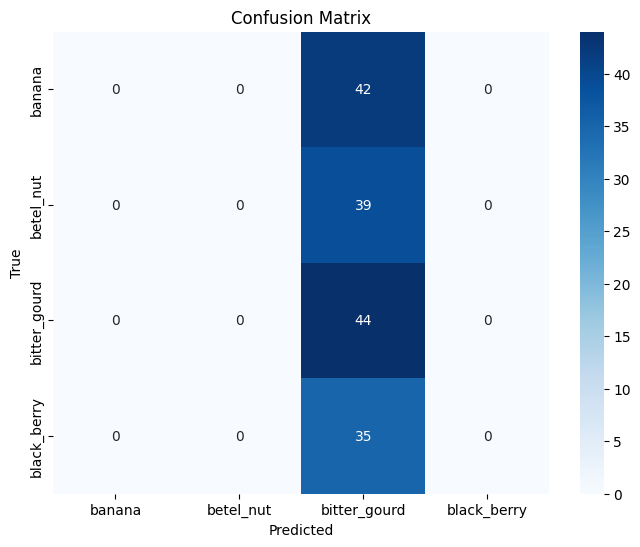

In [ ]:
prediction_base, ground_truth = testing(base,test_ds)

In [ ]:
loss, accuracy, auc = base.evaluate(test_ds)
print("Test Loss:", loss, "Test Accuracy:", accuracy, "Test AUC:", auc)

40/40 [==============================] - 1s 20ms/step - loss: 1.3851 - categorical_accuracy: 0.2750 - auc: 0.5188
Test Loss: 1.3850785493850708 Test Accuracy: 0.2750000059604645 Test AUC: 0.5188020467758179


### Modified


1/1 [==============================] - 0s 20ms/step
Precision: 0.8318865620752414
Recall: 0.8237860537631705
F1-score: 0.8211056487372278
Accuracy 0.8157894736842105

              precision    recall  f1-score   support

           0       0.79      0.58      0.67        38
           1       0.74      0.93      0.82        42
           2       0.84      0.83      0.84        46
           3       0.96      0.96      0.96        26

    accuracy                           0.82       152
   macro avg       0.83      0.82      0.82       152
weighted avg       0.82      0.82      0.81       152




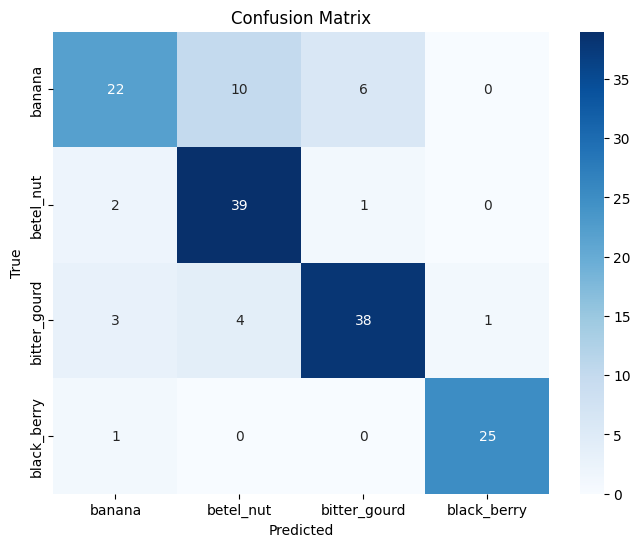

In [22]:
prediction_modified, ground_truth = testing(modified_best,test_ds)

In [23]:
loss, accuracy, auc = modified_best.evaluate(test_ds)
print("Test Loss:", loss, "Test Accuracy:", accuracy, "Test AUC:", auc)

38/38 [==============================] - 6s 140ms/step - loss: 0.4766 - categorical_accuracy: 0.8026 - auc_1: 0.9625
Test Loss: 0.4766167998313904 Test Accuracy: 0.8026315569877625 Test AUC: 0.962517261505127


Untuk evaluation, saya hanya menggunakan modified model tuner ver yang merupakan best model dan dibandingkan dengan base architechture. Meskipun hanya dilihat sekilas, kita sudah bisa mengetahui bahwa model yang sudah modified merupakan a better model compared to base model yang ada. Perbandingan akurasi mereka berturut-turut adalah 0.8026315569877625 dan 0.2750000059604645.

Model modified tuner ver tidak hanya unggul dalam hal metric accuracy, melainkan juga metric-metric yang lain.

BASE:\
Precision: 0.06875\
Recall: 0.25\
F1-score: 0.10784313725490198\
Accuracy 0.275

MODIFIED: \
Precision: 0.8318865620752414\
Recall: 0.8237860537631705\
F1-score: 0.8211056487372278\
Accuracy 0.8157894736842105

Perbandingan semua metric tersebut makes it clearer that modified model tuner ver merupakan a better model compared to base model yang ada.


Terakhir, dapat dilihat pada confusion matrix, bahwa base model tidak memiliki kemampuan untuk memprediksi class lain dan hanya spam class bitter_gourd dalam prediksinya. On the other hand, modified model tuner version sudah lebih memiliki kemampuan dalam membedakan karakteristik antar kelas secara overall. Meskipun keliahatannya modified model turner kurang bisa mengklasifikasi class banana karena model tersebut beberapa kali salah mengklasifikasikan banana ke betel_nut dan bitter_gourd. 